# User Engagement Analysis

## Imports

In [102]:
import pickle
import numpy as np
import pandas as pd
import math
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [103]:
sys.path.append(os.path.abspath(os.path.join('../scripts')))
from df_selector import *
from df_visualizer import *
from df_outlier_handler import OutlierHandler

## Reading Data

In [104]:
df = pd.read_csv("../data/clean_data.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146887 entries, 0 to 146886
Data columns (total 55 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Unnamed: 0                        146887 non-null  int64  
 1   Bearer Id                         146887 non-null  int64  
 2   Start                             146887 non-null  object 
 3   Start Offset (ms)                 146887 non-null  float64
 4   End                               146887 non-null  object 
 5   End Offset (ms)                   146887 non-null  float64
 6   IMSI                              146887 non-null  int64  
 7   MSISDN/Number                     146887 non-null  int64  
 8   IMEI                              146887 non-null  int64  
 9   Last Location Name                146887 non-null  object 
 10  Avg RTT DL (ms)                   146887 non-null  float64
 11  Avg RTT UL (ms)                   146887 non-null  f

## User Engagement Metrics

In [105]:
user_engagement_df = df[['MSISDN/Number', 'Bearer Id', 'Dur (ms)', 'Total Data Volume (Bytes)']]

In [106]:
# aggregating user engagement metrics per user
user_engagement_df = user_engagement_df.groupby(
    'MSISDN/Number').agg({'Bearer Id': 'count', 'Dur (ms)': 'sum', 'Total Data Volume (Bytes)': 'sum'})
user_engagement_df = user_engagement_df.rename(
    columns={'Bearer Id': 'xDR Sessions'})
user_engagement_df.head()

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,
33601001722,1,116720140.0,8.786906e+08
33601001754,1,181230963.0,1.568596e+08
33601002511,1,134969374.0,5.959665e+08
33601007832,1,49878024.0,4.223207e+08
33601008617,2,37104453.0,1.457411e+09


In [107]:
# top 10 customers per xDR sessions
user_engagement_df.nlargest(10, 'xDR Sessions')

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,
33626320676,18,4.007350e+09,7.971167e+09
33614892860,17,3.900326e+09,8.846226e+09
33625779332,17,4.138399e+09,8.499621e+09
33659725664,16,3.492572e+09,7.705863e+09
33675877202,15,3.332226e+09,7.891111e+09
33760536639,15,3.396886e+09,8.514774e+09
33667163239,13,3.114213e+09,5.618394e+09
33603127838,12,2.855537e+09,4.976195e+09
33604515716,12,2.780126e+09,5.487855e+09


In [108]:
# top 10 customers per duration(ms)
user_engagement_df.nlargest(10, 'Dur (ms)')

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,
33625779332,17,4.138399e+09,8.499621e+09
33626320676,18,4.007350e+09,7.971167e+09
33614892860,17,3.900326e+09,8.846226e+09
33659725664,16,3.492572e+09,7.705863e+09
33760536639,15,3.396886e+09,8.514774e+09
33675877202,15,3.332226e+09,7.891111e+09
33667163239,13,3.114213e+09,5.618394e+09
33603127838,12,2.855537e+09,4.976195e+09
33627080969,12,2.782433e+09,5.754731e+09


In [109]:
# top 10 customers per total data traffic
user_engagement_df.nlargest(10, 'Total Data Volume (Bytes)')

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,
33614892860,17,3.900326e+09,8.846226e+09
33760536639,15,3.396886e+09,8.514774e+09
33625779332,17,4.138399e+09,8.499621e+09
33626320676,18,4.007350e+09,7.971167e+09
33675877202,15,3.332226e+09,7.891111e+09
33659725664,16,3.492572e+09,7.705863e+09
33666464084,11,2.597086e+09,7.308501e+09
33760413819,12,2.676862e+09,7.132371e+09
33664712899,11,2.603570e+09,6.872337e+09


## Outliers

In [110]:
outlier_handler = OutlierHandler(user_engagement_df)

<AxesSubplot:>

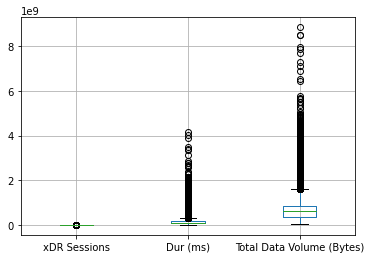

In [111]:
user_engagement_df.boxplot()

In [112]:
outlier_handler.getOverview(['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)'])

Name of columns,Dur (ms),Total Data Volume (Bytes),xDR Sessions
Min,7142988.0,33249009.0,1.0
Q1,72727203.0,357937385.25,1.0
Median,103112793.5,616932960.5,1.0
Q3,172800017.0,856483490.5,2.0
Max,4138398859.0,8846226494.0,18.0
IQR,100072814.0,498546105.25,1.0
Lower fence,-77382018.0,-389881772.625,-0.5
Upper fence,322909238.0,1604302648.375,3.5
Skew,5.489767,2.232846,3.317168
Number_of_outliers,6880,5148,3144


In [113]:
outlier_handler.replace_outliers_with_fences(['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)'])

In [114]:
outlier_handler.getOverview(['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)'])

Name of columns,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
Min,1.0,7142988.0,33249009.0
Q1,1.0,72727203.0,357937385.25
Median,1.0,103112793.5,616932960.5
Q3,2.0,172800017.0,856483490.5
Max,3.5,322909238.0,1604302648.375
IQR,1.0,100072814.0,498546105.25
Lower fence,-0.5,-77382018.0,-389881772.625
Upper fence,3.5,322909238.0,1604302648.375
Skew,1.799445,0.808236,0.762778
Number_of_outliers,0,0,0


<AxesSubplot:>

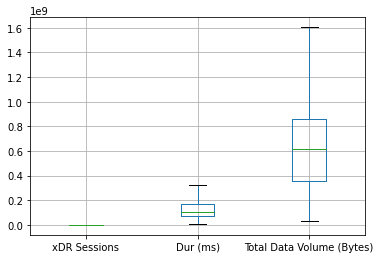

In [115]:
user_engagement_df.boxplot()

## K-means Clustering

In [116]:
# scale data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(user_engagement_df)
scaled_data

array([[-0.54866182, -0.14578281,  0.54827419],
       [-0.54866182,  0.6146225 , -1.28049119],
       [-0.54866182,  0.0693255 , -0.16800992],
       ...,
       [-0.54866182, -1.41773868,  0.13265469],
       [-0.54866182,  0.14027633, -0.46103345],
       [-0.54866182,  1.3675591 , -0.1671958 ]])

In [117]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69518453, -0.1847148 ,  0.69469339],
       [-0.36033465,  0.40365445, -0.84096493],
       [-0.94927152,  0.11994406, -0.29068368],
       ...,
       [-0.35954757, -0.92906865,  0.08693091],
       [-0.75133844,  0.19209465, -0.63134   ],
       [-0.36997482,  0.9221754 , -0.11274383]])

In [118]:
kmeans = KMeans(n_clusters=3, random_state=1).fit(normalized_data)
kmeans.labels_

array([2, 0, 0, ..., 2, 0, 0], dtype=int32)

In [119]:
user_engagement_df.insert(0, 'cluster', kmeans.labels_)
user_engagement_df

,cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,,
33601001722,2,1.0,116720140.0,8.786906e+08
33601001754,0,1.0,181230963.0,1.568596e+08
33601002511,0,1.0,134969374.0,5.959665e+08
33601007832,2,1.0,49878024.0,4.223207e+08
33601008617,1,2.0,37104453.0,1.457411e+09
...,...,...,...,...
33789967113,0,1.0,160461578.0,2.081231e+08
33789980299,1,2.0,210390146.0,1.094693e+09
33789996170,2,1.0,8810688.0,7.146416e+08


In [120]:
user_engagement_df['cluster'].value_counts()

2    52883
1    28336
0    24497
Name: cluster, dtype: int64

In [136]:
fig = px.scatter(user_engagement_df, x='Total Data Volume (Bytes)', y='Dur (ms)',
                 color='cluster', size='xDR Sessions')
fig.show()

In [122]:
cluster0 = user_engagement_df[user_engagement_df["cluster"]==0]
cluster0[['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)']].describe()

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
count,24497.000000,2.449700e+04,2.449700e+04
mean,1.000531,1.721037e+08,4.895900e+08
std,0.023031,3.880252e+07,2.452351e+08
min,1.000000,1.158294e+08,3.357584e+07
25%,1.000000,1.411106e+08,2.776101e+08
50%,1.000000,1.625593e+08,4.865760e+08
75%,1.000000,1.910602e+08,7.017620e+08
max,2.000000,3.229092e+08,9.507607e+08


In [123]:
cluster1 = user_engagement_df[user_engagement_df["cluster"]==1]
cluster1[['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)']].describe()

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
count,28336.000000,2.833600e+04,2.833600e+04
mean,2.318535,2.078411e+08,1.114830e+09
std,0.547993,9.330425e+07,3.728590e+08
min,2.000000,1.823580e+07,1.197685e+08
25%,2.000000,1.314686e+08,8.340745e+08
50%,2.000000,2.001904e+08,1.115258e+09
75%,3.000000,3.180281e+08,1.466214e+09
max,3.500000,3.229092e+08,1.604303e+09


In [124]:
cluster2 = user_engagement_df[user_engagement_df["cluster"]==2]
cluster2[['xDR Sessions', 'Dur (ms)', 'Total Data Volume (Bytes)']].describe()

,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
count,52883.000000,5.288300e+04,5.288300e+04
mean,1.006183,6.696395e+07,4.997910e+08
std,0.078392,3.140478e+07,2.431928e+08
min,1.000000,7.142988e+06,3.324901e+07
25%,1.000000,3.519956e+07,2.914273e+08
50%,1.000000,8.433441e+07,5.024644e+08
75%,1.000000,8.640324e+07,7.093071e+08
max,2.000000,1.247613e+08,9.495983e+08


## Total traffic of applications per user

In [125]:
user_app_engagement_df = df[['MSISDN/Number', 'Social Media Data Volume (Bytes)', 'Google Data Volume (Bytes)',
    'Email Data Volume (Bytes)', 'Youtube Data Volume (Bytes)', 'Netflix Data Volume (Bytes)',
    'Gaming Data Volume (Bytes)', 'Other Data Volume (Bytes)']]

In [126]:
# aggregating user app engagement metrics per user
user_app_engagement_df = user_app_engagement_df.groupby(
    'MSISDN/Number').sum()
user_app_engagement_df.head()

,Social Media Data Volume (Bytes),Google Data Volume (Bytes),Email Data Volume (Bytes),Youtube Data Volume (Bytes),Netflix Data Volume (Bytes),Gaming Data Volume (Bytes),Other Data Volume (Bytes)
MSISDN/Number,,,,,,,
33601001722,2232135.0,4389005.0,1331362.0,21624548.0,27180981.0,8.124587e+08,386570872.0
33601001754,2660565.0,5334863.0,3307781.0,12432223.0,11221763.0,1.197501e+08,281710071.0
33601002511,3195623.0,3443126.0,3205380.0,21333570.0,19353900.0,5.388277e+08,501693672.0
33601007832,280294.0,9678493.0,2284670.0,6977321.0,1942092.0,3.911261e+08,35279702.0
33601008617,2912542.0,18499616.0,3305469.0,41533002.0,49201724.0,1.314798e+09,804804484.0


In [127]:
# top 10 most engaged users per app
social_media = user_app_engagement_df.nlargest(10, "Social Media Data Volume (Bytes)")['Social Media Data Volume (Bytes)']
google = user_app_engagement_df.nlargest(10, "Google Data Volume (Bytes)")['Google Data Volume (Bytes)']
email = user_app_engagement_df.nlargest(10, "Email Data Volume (Bytes)")['Email Data Volume (Bytes)']
youtube = user_app_engagement_df.nlargest(10, "Youtube Data Volume (Bytes)")['Youtube Data Volume (Bytes)']
netflix = user_app_engagement_df.nlargest(10, "Netflix Data Volume (Bytes)")['Netflix Data Volume (Bytes)']
gaming = user_app_engagement_df.nlargest(10, "Gaming Data Volume (Bytes)")['Gaming Data Volume (Bytes)']
other = user_app_engagement_df.nlargest(10, "Other Data Volume (Bytes)")['Other Data Volume (Bytes)']

In [128]:
apps_sum = user_app_engagement_df.sum().sort_values(ascending=False)
apps_sum

Gaming Data Volume (Bytes)          6.321321e+13
Other Data Volume (Bytes)           6.305373e+13
Youtube Data Volume (Bytes)         3.325813e+12
Netflix Data Volume (Bytes)         3.323940e+12
Google Data Volume (Bytes)          1.146890e+12
Email Data Volume (Bytes)           3.318305e+11
Social Media Data Volume (Bytes)    2.684706e+11
dtype: float64

## Optimized value of k for user engagement k-means clustering


Distortion is the average of the euclidean squared distance from the centroid of their respective clusters. Inertia is the sum of squared distances of samples to their closest cluster centre.

In [131]:
def choose_kmeans(df: pd.DataFrame, num: int):
  distortions = []
  inertias = []
  K = range(1, num)
  for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0).fit(df)
    distortions.append(sum(
        np.min(cdist(df, kmeans.cluster_centers_, 'euclidean'), axis=1)) / df.shape[0])
    inertias.append(kmeans.inertia_)

  return (distortions, inertias)

In [133]:
distortions, inertias = choose_kmeans(normalized_data, 20)

In [138]:
fig = make_subplots(
    rows=1, cols=2, subplot_titles=("Distortion", "Inertia")
)
fig.add_trace(go.Scatter(x=np.array(range(1, 20)), y=distortions), row=1, col=1)
fig.add_trace(go.Scatter(x=np.array(range(1, 20)), y=inertias), row=1, col=2)
fig.update_layout(title_text="The Elbow Method", height=500)
fig.show()

I think making k=6 is an optimal value.

In [141]:
kmeans = KMeans(n_clusters=6, random_state=6).fit(normalized_data)
kmeans.labels_

array([4, 1, 1, ..., 4, 1, 3], dtype=int32)

In [142]:
user_engagement_df["cluster"]= kmeans.labels_
user_engagement_df

,cluster,xDR Sessions,Dur (ms),Total Data Volume (Bytes)
MSISDN/Number,,,,
33601001722,4,1.0,116720140.0,8.786906e+08
33601001754,1,1.0,181230963.0,1.568596e+08
33601002511,1,1.0,134969374.0,5.959665e+08
33601007832,5,1.0,49878024.0,4.223207e+08
33601008617,0,2.0,37104453.0,1.457411e+09
...,...,...,...,...
33789967113,1,1.0,160461578.0,2.081231e+08
33789980299,2,2.0,210390146.0,1.094693e+09
33789996170,4,1.0,8810688.0,7.146416e+08


In [143]:
fig = px.scatter(user_engagement_df, x='Total Data Volume (Bytes)', y='Dur (ms)',
                 color='cluster', size='xDR Sessions')
fig.show()

## Saving Data

In [144]:
# save the dataframe
user_engagement_df.to_csv('../data/user_engagement_data.csv')

In [146]:
# save the clustering model
with open("../models/user_engagement.pkl", "wb") as f:
    pickle.dump(kmeans, f)